# Going Deeper(CV)
# 9. 나를 찾아줘 - Class Activation Map 만들기 [프로젝트]

## 9-1. 프로젝트: CAM을 만들고 평가해 보자

### 라이브러리 버전 확인하기

In [1]:
import tensorflow as tf
import numpy as np
import cv2
import PIL

print(tf.__version__)
print(np.__version__)
print(cv2.__version__)
print(PIL.__version__)

2.12.0
1.22.4
4.7.0
8.4.0


In [2]:
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

import copy
from PIL import Image

### 구글 드라이브 연동하기

In [3]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/aiffel/Going_deeper

Mounted at /content/drive
/content/drive/MyDrive/aiffel/Going_deeper


### 데이터셋 불러오기

In [4]:
(ds_train, ds_test), ds_info = tfds.load(
    'stanford_dogs',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/12000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteU8H2P8/stanford_dogs-train.tfrecord*...:   0…

Generating test examples...:   0%|          | 0/8580 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteU8H2P8/stanford_dogs-test.tfrecord*...:   0%…

Dataset stanford_dogs downloaded and prepared to /root/tensorflow_datasets/stanford_dogs/0.2.0. Subsequent calls will reuse this data.


### 데이터 전처리

In [5]:
def normalize_and_resize_img(input):
    # Normalizes images: `uint8` -> `float32`
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img,
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [6]:
ds_train_norm = apply_normalize_on_dataset(ds_train)
ds_val_norm = apply_normalize_on_dataset(ds_test)

### CAM 구현하기

#### 베이스 모델 구현

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

num_classes = ds_info.features['label'].num_classes

base_model = keras.applications.resnet50.ResNet50(
    include_top=False,  # 마지막 분류기 부분은 새로 만들 것이기 때문에 제외했습니다.
    weights="imagenet", # 가중치는 imagenet을 기준으로 학습되었습니다.
    input_shape=(224, 224, 3),
    pooling="avg"   # GAP를 간단하게 선언할 수 있습니다.
)
x = base_model.output
outputs = keras.layers.Dense(num_classes, activation="softmax")(x)  # softmax 함수를 통해 GAP결과를 분류
cam_model = keras.Model(base_model.input, outputs)

cam_model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
    metrics=['accuracy']
)

# EarlyStopping과 Checkpoint 콜백을 생성합니다.
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
file_path = 'data/class_activation_map/cam_model.h5'
checkpoint = ModelCheckpoint(file_path, monitor='val_loss', save_best_only=True)

history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(ds_info.splits['train'].num_examples / 16),
    validation_steps=int(ds_info.splits['test'].num_examples / 16),
    epochs=50,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/50
750/750 [==============================] - 205s 217ms/step - loss: 2.9157 - accuracy: 0.3197 - val_loss: 3.4513 - val_accuracy: 0.1927
Epoch 2/50
750/750 [==============================] - 167s 222ms/step - loss: 0.9972 - accuracy: 0.7129 - val_loss: 1.5346 - val_accuracy: 0.5681
Epoch 3/50
750/750 [==============================] - 174s 232ms/step - loss: 0.2784 - accuracy: 0.9338 - val_loss: 1.2351 - val_accuracy: 0.6567
Epoch 4/50
750/750 [==============================] - 161s 215ms/step - loss: 0.1159 - accuracy: 0.9808 - val_loss: 1.2189 - val_accuracy: 0.6673
Epoch 5/50
750/750 [==============================] - 161s 214ms/step - loss: 0.0451 - accuracy: 0.9952 - val_loss: 1.1072 - val_accuracy: 0.7037
Epoch 6/50
750/750 [==============================] - 161s 214ms/step - loss: 0.0142 - accuracy: 0.9994 - val_loss: 1.0669 - val_accuracy: 0.7203
Epoch 7/50
750/750 [==============================] - 161s 214ms/step - loss: 0.0071 - accuracy: 0.9999 - val_loss: 1.0720 -

KeyboardInterrupt: ignored

#### 학습 결과 시각화

마지막 컨볼루션 레이어의 형상에 대한 필터를 나열해서 더하는 것이 CAM  
GAP > 필터 안 weight들의 평균  
gap 레이어 다음 softmax 레이어

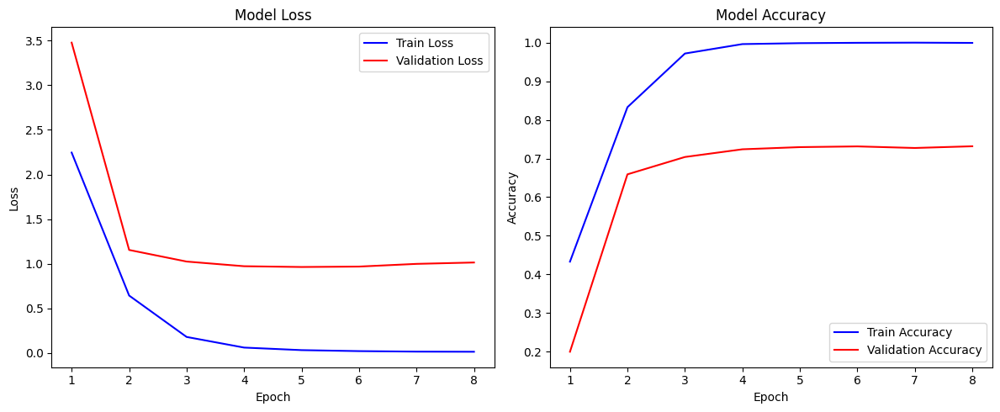

In [ ]:
# 결과 시각화
import pickle
import matplotlib.pyplot as plt

with open('data/class_activation_map/history.pkl', 'rb') as file:
    history = pickle.load(file)
tr_loss = history['loss']
tr_acc = history['accuracy']
val_loss = history['val_loss']
val_acc = history['val_accuracy']

epochs = range(1, len(tr_loss) + 1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, 'b', label='Train Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, 'b', label='Train Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

모델의 분류 정확도는 0.7 근처인 것 같습니다.  
성능은 좋지 않지만 제대로 수렴하여 학습이 종료되었습니다.

#### 이미지 가져오기

In [9]:
def get_one(ds):
    ds = ds.take(1)
    sample_data = list(ds.as_numpy_iterator())
    bbox = sample_data[0]['objects']['bbox']
    image = sample_data[0]['image']
    label = sample_data[0]['label']
    return sample_data[0]

40


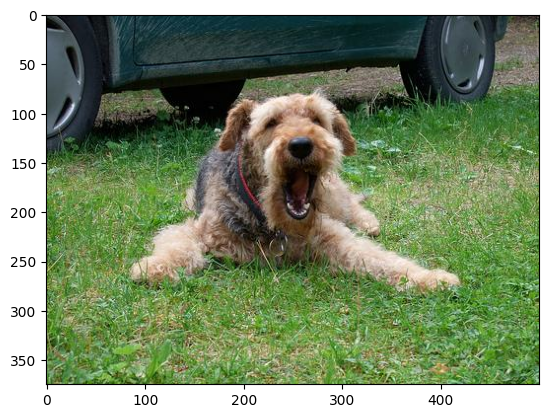

In [ ]:
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])

#### CAM 생성 함수 만들기

In [23]:
cam_model_path = 'data/class_activation_map/cam_model.h5'
cam_model = tf.keras.models.load_model(cam_model_path)

도저히 예제를 보지 않으면 만들 수가 없었습니다..  
그래서 일단 예제 코드를 긁어오고 이를 한 줄씩 전부 해석하면서 이해하는 식으로 공부하기로 했습니다..

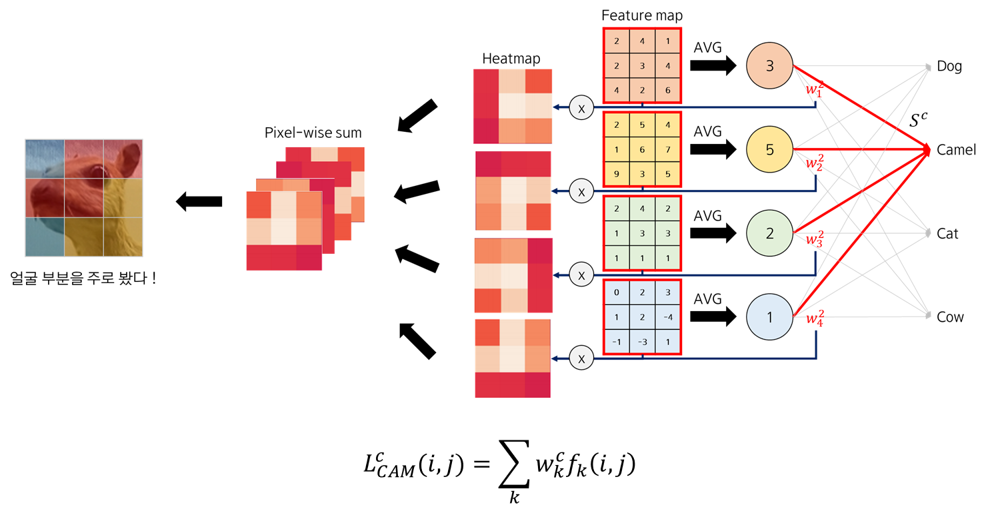

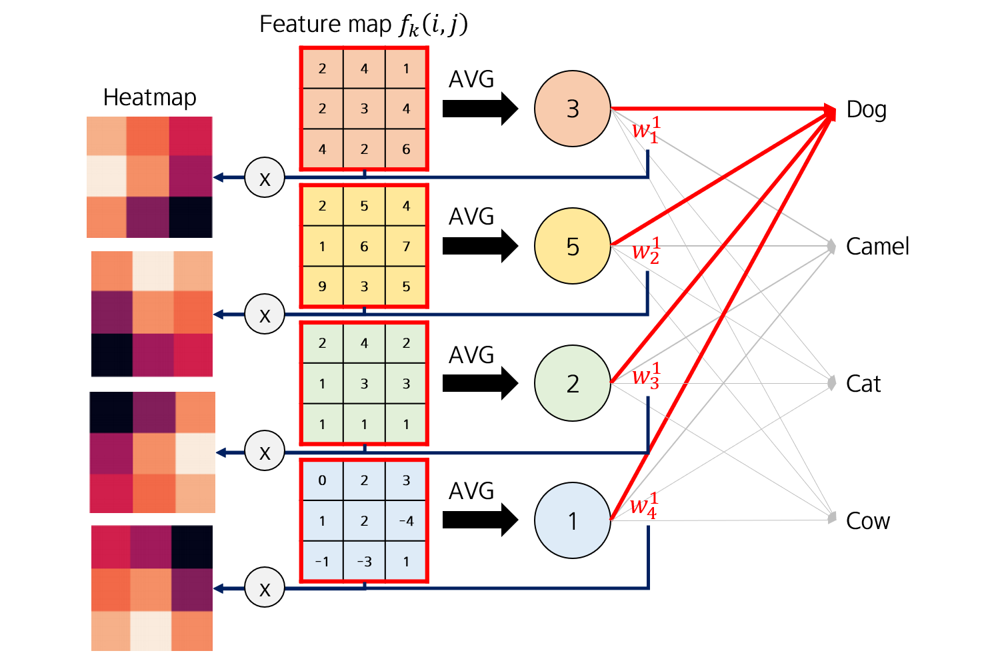

[이미지 출처](https://tyami.github.io/deep%20learning/CNN-visualization-Grad-CAM/)  

위의 블로그가 CAM의 작동을 공부하는 데 많은 도움을 줬습니다.

In [10]:
def generate_cam(model, item):
    item = copy.deepcopy(item)  # item을 복사합니다. 이 때 deepcopy는 원본 객체를 복사하여 새로운 독립적인 객체를 생성합니다.
                                # 즉, 복사된 객체를 수정하더라도 원본 객체에 영향이 가지 않습니다.

    width = item['image'].shape[1]  # 이미지의 shape의 가로 크기 정보를 width로 사용합니다.
    height = item['image'].shape[0] # 이미지의 shape의 세로 크기 정보를 height로 사용합니다.

    img_tensor, class_idx = normalize_and_resize_img(item)  # item을 전처리하고 반환값으로 이미지(텐서형식), 라벨을 가져옵니다.

    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])  # cam_model을 새로 정의합니다.
                                                                                                # 새로 정의하는 이유는 인자로 들어온 model의 내부 값을 봐야하기 때문입니다.
                                                                                                # CAM을 생성하기 위해서는 특성 맵, 소프트맥스 레이어의 가중치, 원하는 클래스의 출력값이 필요합니다.
                                                                                                # 여기서 model.layers[-3].output이 바로 Global Average Pooling 직전의 레이어의 출력값입니다.
                                                                                                # model.output은 소프트맥스 레이어의 출력값입니다.
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))    # 차원을 한 차원 확장합니다. 배치 차원이 확장되며 [1, 7, 7, 2048], [1, 2048]의 형태가 됩니다.(이미지가 1장이므로)
    conv_outputs = conv_outputs[0, :, :, :] # 특성 맵을 가져오는 부분입니다. [1, 7, 7, 2048] > [7, 7, 2048] 형태로 슬라이싱합니다.
                                            # 차원을 늘렸다가 줄일거면 왜 차원을 늘리나 싶어서 지워봤는데, 오류가 납니다..ㅋㅋ

    class_weights = model.layers[-1].get_weights()[0]   # 가중치(2048, 120), 편향(120, )의 형태로 가중치가 저장되어 있습니다.

    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])   # 특성맵의 형태와 같은 0으로 채워진 배열을 준비합니다.
    for i, w in enumerate(class_weights[:, class_idx]):
        cam_image += w * conv_outputs[:, :, i]  # 마지막 softmax 함수를 포함한 Dense 레이어의 가중치를 특성맵에 곱한 결과를 앞서 준비한 0으로 채워진 배열에 추가합니다.
                                                # 이렇게 하면 각 채널이 어떤 부분을 가장 활성화하는지 나타내는 히트맵이 2048개 생성됩니다.
    cam_image /= np.max(cam_image)  # CAM이미지의 결과값을 0~1사이의 범위로 정규화
    cam_image = cam_image.numpy()   # 텐서에서 넘파이 배열로 변환
    cam_image = cv2.resize(cam_image, (width, height))  # 이미지를 원래 크기로 맞추기 위해 resize
    return cam_image

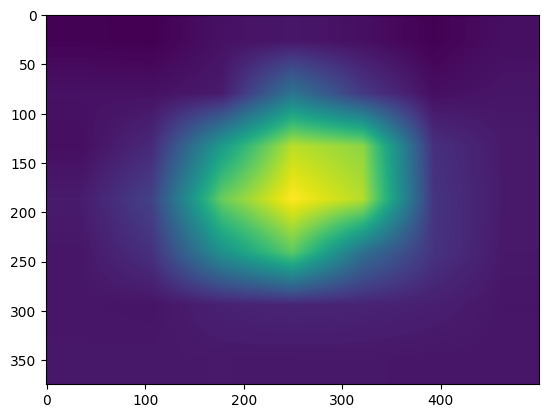

In [ ]:
cam_image = generate_cam(cam_model, item)
plt.imshow(cam_image)

#### CAM 시각화

In [11]:
def visualize_cam_on_image(src1, src2, alpha=0.8):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    return merged_image

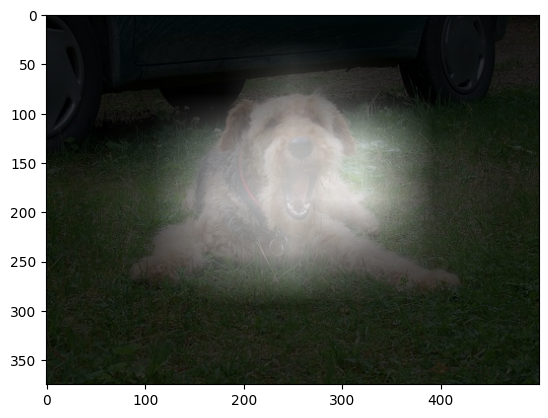

In [ ]:
origin_image = item['image'].astype(np.uint8)
# cam_image_3channel = np.stack([cam_image * 255] * 3, axis=-1).astype(np.uint8)
cam_image_3channel = np.stack([np.clip(cam_image * 255, 0, 255)] * 3, axis=-1).astype(np.uint8) # 예제 코드대로 실행하면 값이 (0, 255)의 범위를 벗어나는 값들이 있어서 np.clip함수를 추가했습니다.

blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)

분류에 영향을 미치는 부분이 밝게 표시되는 것을 확인할 수 있습니다.  
아마 AI도 얼굴을 보고 분류하나봅니다.

참고로 np.clip으로 범위를 지정하지 않으면 아래와 같이 됩니다...

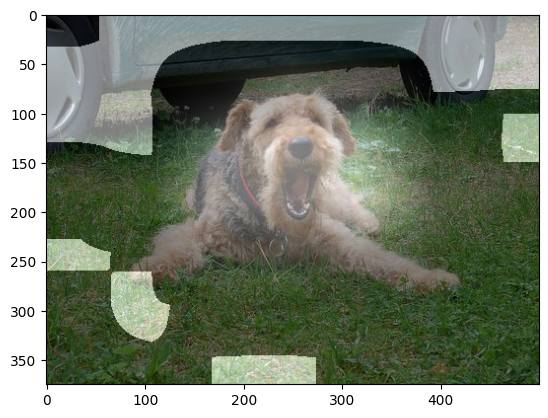

### Grad-CAM

40


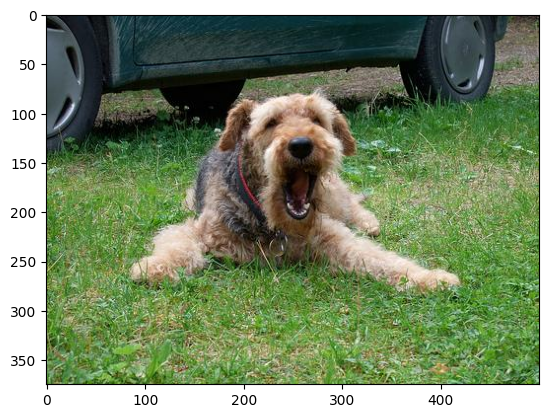

In [ ]:
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])

In [12]:
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, class_idx = normalize_and_resize_img(item)

    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])

    # 여기부터가 CAM과는 다른 부분입니다. Gradient가 필요하기 때문에 GradientTape()를 사용합니다.
    with tf.GradientTape() as tape: # tf.GradientTape()을 tape라는 변수로 선언하고, 이후의 연산을 기록합니다.
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))   # 차원을 한 차원 확장합니다. 배치 차원이 확장되며 [1, 7, 7, 2048], [1, 2048]의 형태가 됩니다.(이미지가 1장이므로)

        loss = pred[:, class_idx]   # 이미지가 해당하는 클래스의 예측값을 선택하여 loss로 정의합니다.
        output = conv_output[0]     # # 특성 맵을 가져오는 부분입니다. [1, 7, 7, 2048] > [7, 7, 2048] 형태로 슬라이싱합니다.
        grad_val = tape.gradient(loss, conv_output)[0]  # Gradient를 구하는 부분입니다. loss를 conv_output에 대해 미분한 값을 계산합니다.
                                                        # [0]번째 인덱스를 사용하는 이유는 원래는 gradient를 계산하면 배치 크기만큼의 값들이 저장되기 때문입니다.
                                                        # 여기서는 배치 크기 자체가 1이고 1장의 이미지만 계산하기 때문에 [0]을 사용합니다.

    weights = np.mean(grad_val, axis=(0, 1))    # grad_val의 평균값을 계산합니다. height, width축을 따라 픽셀의 평균값을 계산합니다.
                                                # 차원이 [2048, ]의 형태로 바뀝니다.
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2]) # 특성맵의 형태와 같은 0으로 채워진 배열을 준비합니다.
    for k, w in enumerate(weights):
        grad_cam_image += w * output[:, :, k]   # 마지막 softmax 함수를 포함한 Dense 레이어의 가중치를 특성맵에 곱한 결과를 앞서 준비한 0으로 채워진 배열에 추가합니다.
                                                # 이렇게 하면 각 채널이 어떤 부분을 가장 활성화하는지 나타내는 히트맵이 2048개 생성됩니다.

    grad_cam_image = tf.math.maximum(0, grad_cam_image) # 음수값은 0으로 변경합니다. 음수 값을 무시하고 양수만 무시한다는 점에서 ReLU와 유사합니다.
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

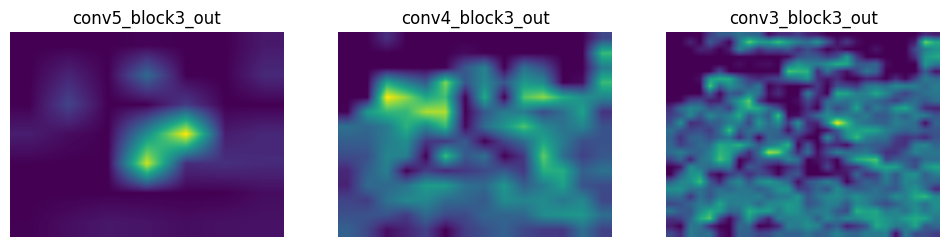

In [ ]:
import matplotlib.pyplot as plt

# Grad-CAM을 생성할 레이어들의 이름
activation_layers = ['conv5_block3_out', 'conv4_block3_out', 'conv3_block3_out']

# Grad-CAM 이미지 생성
grad_cam_images = []
for layer_name in activation_layers:
    grad_cam_image = generate_grad_cam(cam_model, layer_name, item)
    grad_cam_images.append(grad_cam_image)

# Grad-CAM 이미지를 연속으로 표시
fig, axes = plt.subplots(1, len(grad_cam_images), figsize=(12, 4))
for i, cam_image in enumerate(grad_cam_images):
    axes[i].imshow(cam_image)
    axes[i].axis('off')
    axes[i].set_title(activation_layers[i])

plt.show()

Text(0.5, 1.0, 'Grad CAM')

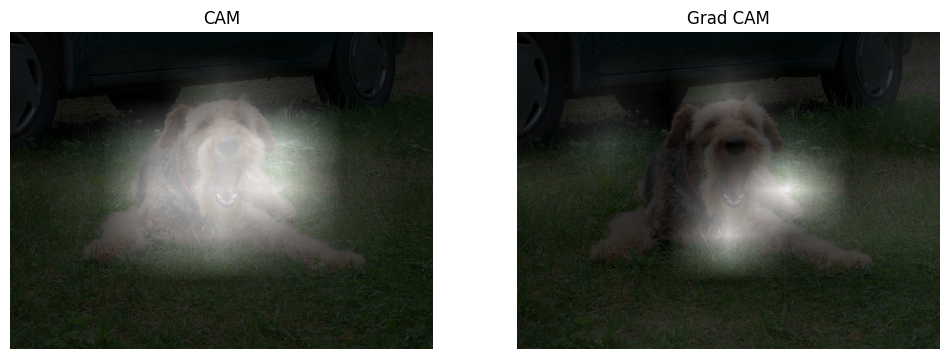

In [ ]:
origin_image = item['image'].astype(np.uint8)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
cam_image_3channel = np.stack([np.clip(grad_cam_image * 255, 0, 255)] * 3, axis=-1).astype(np.uint8)

blended_image2 = visualize_cam_on_image(cam_image_3channel, origin_image)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(blended_image)
axes[0].axis('off')
axes[0].set_title('CAM')
axes[1].imshow(blended_image2)
axes[1].axis('off')
axes[1].set_title('Grad CAM')

역시 얼굴 주변에 집중된 것을 확인할 수 있습니다.  
그런데 Grad-CAM 방식은 뭔가 CAM방식보다 표현되는 면적이 적어 보입니다...  
이 부분의 이유가 궁금하네요.

### 바운딩 박스

40


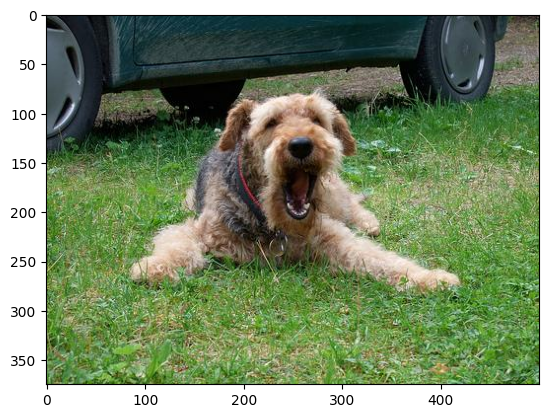

In [ ]:
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])

In [13]:
def get_bbox(cam_image, score_thresh=0.05):
    low_indicies = cam_image <= score_thresh
    cam_image[low_indicies] = 0
    cam_image = (cam_image * 255).astype(np.uint8)

    contours, _ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    rotated_rect = cv2.minAreaRect(cnt)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)
    return rect

def rect_to_minmax(rect, image):
    bbox = [
        rect[:, 1].min() / float(image.shape[0]),
        rect[:, 0].min() / float(image.shape[1]),
        rect[:, 1].max() / float(image.shape[0]),
        rect[:, 0].max() / float(image.shape[1])
    ]
    return bbox

# minmax 형식을 다시 4개의 점 형식으로 바꾸는 함수입니다.
def minmax_to_rect(bbox, image):
    bbox = bbox.flatten()
    rect = [
        [bbox[1] * image.shape[1], bbox[0] * image.shape[0]],
        [bbox[3] * image.shape[1], bbox[0] * image.shape[0]],
        [bbox[3] * image.shape[1], bbox[2] * image.shape[0]],
        [bbox[1] * image.shape[1], bbox[2] * image.shape[0]]
    ]
    return rect

def get_iou(boxA, boxB):
    y_min = max(boxA[0], boxB[0])
    x_min = max(boxA[1], boxB[1])
    y_max = min(boxA[2], boxB[2])
    x_max = min(boxA[3], boxB[3])

    interArea = max(0, x_max - x_min) * max(0, y_max - y_min)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

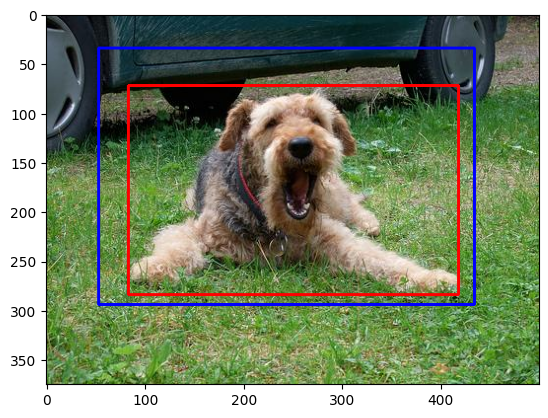

In [ ]:
rect = get_bbox(cam_image)
image = copy.deepcopy(item['image'])
label_bbox = minmax_to_rect(item['objects']['bbox'], image)
image = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image = cv2.drawContours(image, [rect], 0, (0, 0, 255), 2)
image
plt.imshow(image)

- 빨간 사각형: 정답 바운딩 박스
- 파란 사각형: CAM 예측 바운딩 박스

눈으로 보기에도 얼추 비슷해 보입니다. 한 번 IOU를 구해보겠습니다.

In [ ]:
pred_bbox = rect_to_minmax(rect, item['image'])
get_iou(pred_bbox, item['objects']['bbox'][0])

0.7203209813546585

관습적으로 0.5의 기준점을 넘으면 합격이라고 했으니 성공한 것 같습니다.

### CAM과 Grad-CAM의 object localization 성능 비교

CAM IOU: 0.72
Grad-CAM IOU: 0.00


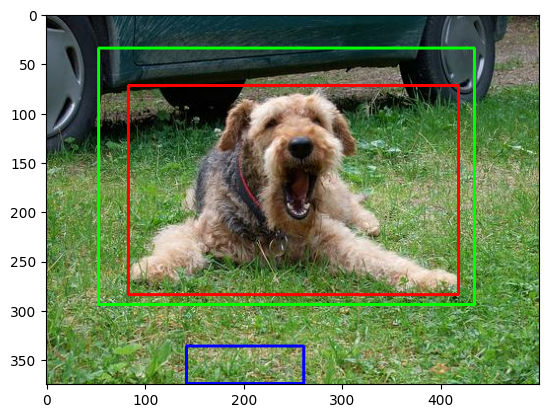

In [ ]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

- 빨간 사각형: 정답 바운딩 박스
- 초록 사각형: CAM 바운딩 박스
- 파란 사각형: Grad-CAM 바운딩 박스


Grad-CAM을 사용한 object detection에 뭔가 문제가 있나 봅니다...


CAM IOU: 0.68
Grad-CAM IOU: 0.61


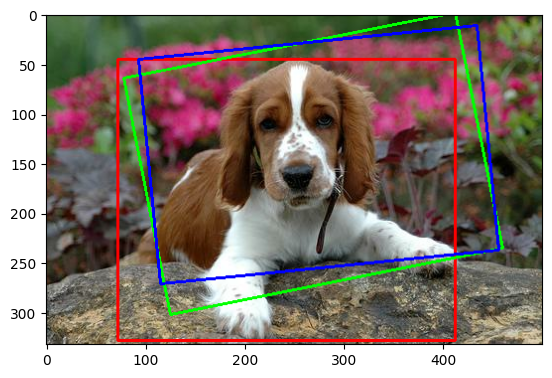

In [ ]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

- 빨간 사각형: 정답 바운딩 박스
- 파란 사각형: CAM 바운딩 박스
- 초록 사각형: Grad-CAM 바운딩 박스


?  
이번엔 잘 됩니다.  
아마 이미지마다 차이가 있나봅니다.

CAM IOU: 0.35
Grad-CAM IOU: 0.24


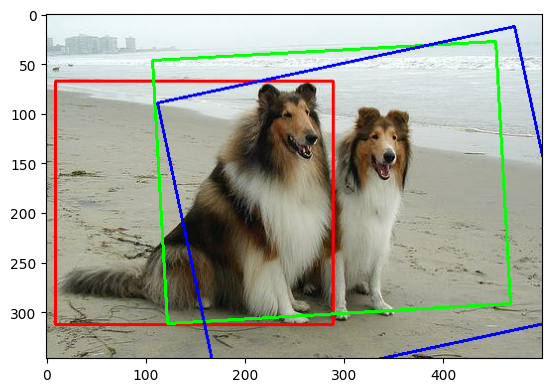

In [ ]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

CAM IOU: 0.33
Grad-CAM IOU: 0.00


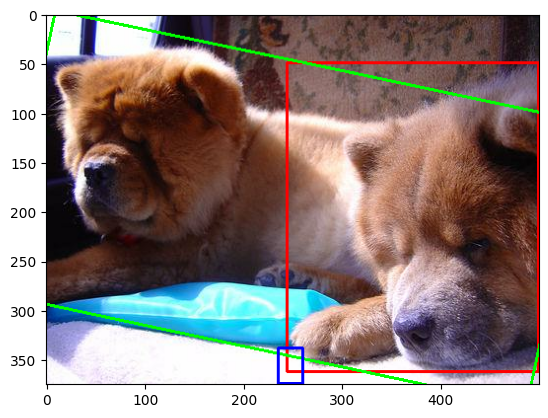

In [31]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

아주 그냥 Grad-CAM 결과는 제멋대로 나오는 것을 확인할 수 있습니다.  
일단 평균적으로 Grad-CAM이 CAM보다 바운딩 박스의 위치를 육안으로 확인해도, IOU로 비교해봐도 성능이 더 떨어지는 것을 확인할 수 있습니다.  
하지만 마지막 레이어의 결과만을 확인할 수 있는 CAM과 달리 Grad-CAM은 모든 레이어의 출력을 선택해서 확인할 수 있기 때문에 적절한 특성 맵을 찾아내어 바운딩 박스를 적용한다면 더 적절한 결과를 얻어낼 수 있을 것 같습니다.  

근데 아무리 봐도 뭔가 이상한 것 같습니다..

### 추가 실험

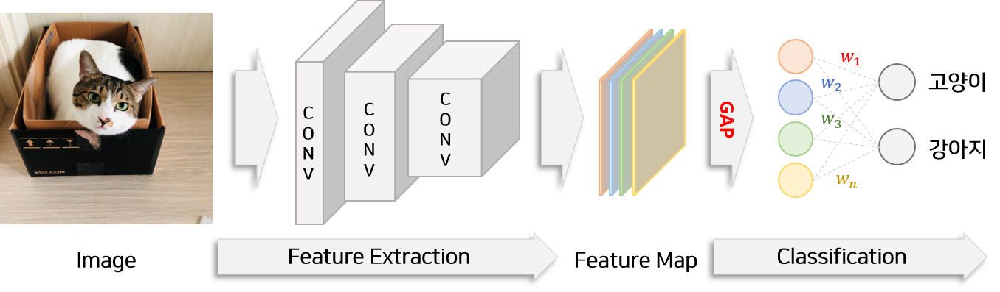

[이미지 출처](https://joungheekim.github.io/2020/09/29/paper-review/)

앞서 실험했던 내용은 사실 위의 이미지와 같습니다.  
하지만 뭔가 이상합니다..  
아래는 CAM 논문에 있는 이미지입니다.

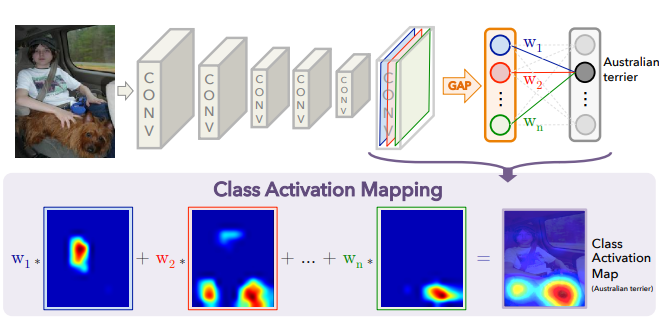

의문점 정리

1. 논문에서는 분명 GAP를 통과한 결과값의 개수가 분류하고자 하는 class의 개수와 일치해야 하는 것 같은데, 이번 실습 뿐 아니라 다른 예제 코드들, 자료들을 뒤져봐도 특별히 class의 개수와 GAP를 통과한 결과의 개수를 일치시키려는 어떠한 시도는 보이지 않았습니다.
2. CAM은 분명 Fully connected layer를 사용하지 않고 GAP의 결과에 softmax 레이어를 적용한다고 하였는데, 결국 분류를 하려면 Dense(activation='softmax')를 사용해야하는 것이 아닌가 하는 의문이 들었습니다.

그래서 모델의 형태를 한 번 바꿔봤습니다.  
- 기존: 2048채널의 결과 > GAP(2048) > softmax(120)의 형태
- 변경: 2048채널의 결과 > 커널 1 사용해 120채널로 축소 > GAP(120) > softmax(120)


어떤 결과가 나올까요..?

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

num_classes = ds_info.features['label'].num_classes

base_model = keras.applications.resnet50.ResNet50(
    include_top=False,  # 마지막 분류기 부분은 새로 만들 것이기 때문에 제외했습니다.
    weights="imagenet", # 가중치는 imagenet을 기준으로 학습되었습니다.
    input_shape=(224, 224, 3),
)
x = base_model.output
x = keras.layers.Conv2D(num_classes, 1, activation='relu')(x)   # GAP레이어를 통과하면 120개 클래스에 대한 값이 하나씩 나와야 하므로
x = keras.layers.GlobalAveragePooling2D()(x)    # GAP레이어로 하나의 스칼라 값이 하나의 클래스를 표현하는 값이 되도록
outputs = keras.layers.Dense(num_classes, activation="softmax")(x)  # softmax 함수를 통해 GAP결과를 분류
cam_model = keras.Model(base_model.input, outputs)

cam_model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
    metrics=['accuracy']
)

# EarlyStopping과 Checkpoint 콜백을 생성합니다.
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
file_path = 'data/class_activation_map/cam_model_modified.h5'
checkpoint = ModelCheckpoint(file_path, monitor='val_loss', save_best_only=True)

history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(ds_info.splits['train'].num_examples / 16),
    validation_steps=int(ds_info.splits['test'].num_examples / 16),
    epochs=50,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
)

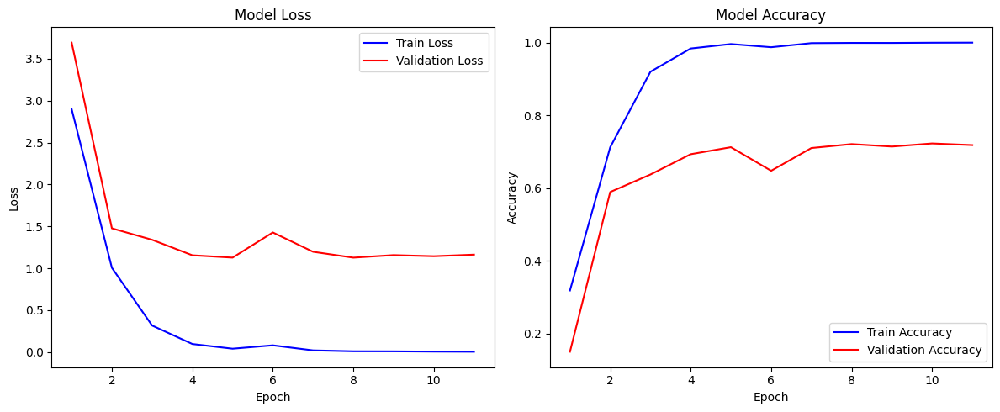

In [ ]:
# 결과 시각화
import pickle
import matplotlib.pyplot as plt

with open('data/class_activation_map/history_modified.pkl', 'rb') as file:
    history = pickle.load(file)
tr_loss = history['loss']
tr_acc = history['accuracy']
val_loss = history['val_loss']
val_acc = history['val_accuracy']

epochs = range(1, len(tr_loss) + 1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, 'b', label='Train Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, 'b', label='Train Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

일단 그래프는 정상적으로 수렴하고 있습니다.  


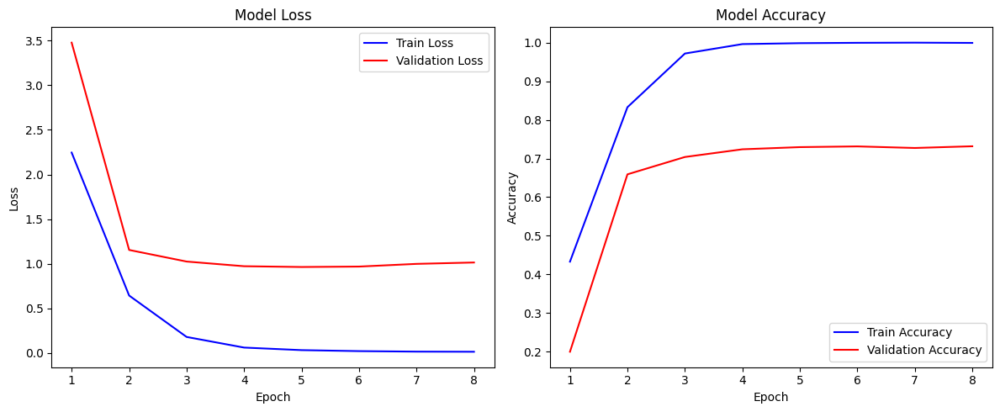

위의 이미지는 모델을 변경하기 이전의 그래프로, 형태는 비슷하지만 에포크가 학습이 종료되기까지의 에포크가 더 적은 것을 확인할 수 있습니다. 이는 단순히 변경한 모델에 conv레이어가 추가되면서 파라미터가 늘어났기 때문일 것입니다.  

두 모델 사이에 정확도 차이는 거의 없는 것 같으니 다음 단계로 넘어가겠습니다.

In [32]:
cam_model_path = 'data/class_activation_map/cam_model_modified.h5'
cam_model = tf.keras.models.load_model(cam_model_path)

CAM IOU: 0.75
Grad-CAM IOU: 0.50


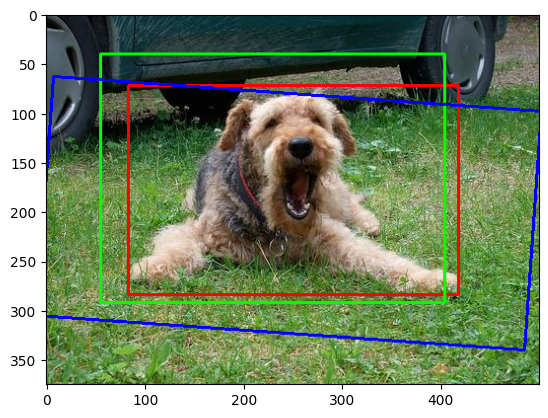

In [16]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

!!!!!  

Grad-CAM을 이용한 결과도 정상적으로 출력되는 것을 확인할 수 있습니다.

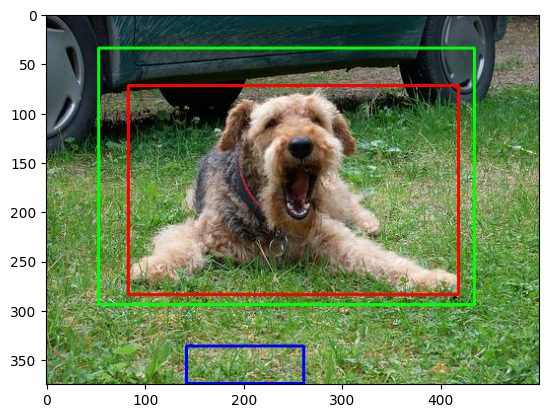

이전의 것과 비교해면 차이가 정말 큽니다.

다른 이미지도 비교해봅시다.

CAM IOU: 0.31
Grad-CAM IOU: 0.29


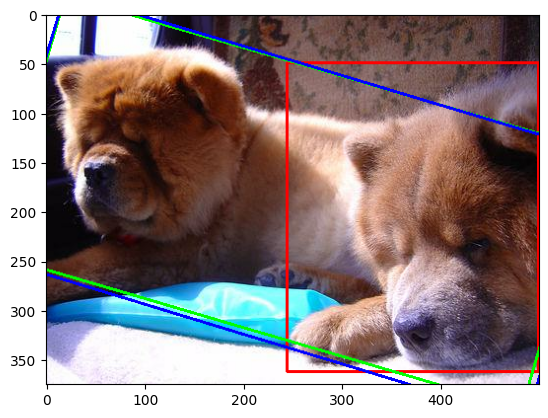

In [34]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

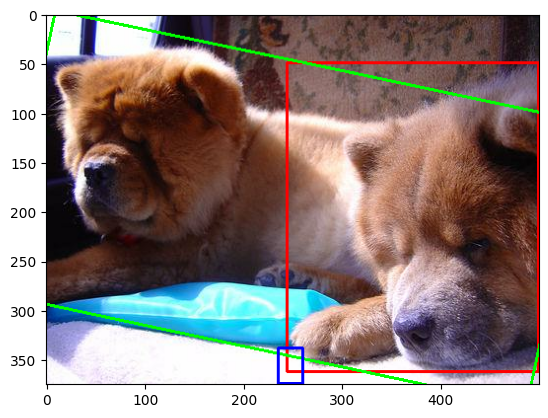

이전과 비교하면 진짜 잘나옵니다!  

다른 것도 테스트 해봅시다.

CAM IOU: 0.32
Grad-CAM IOU: 0.00


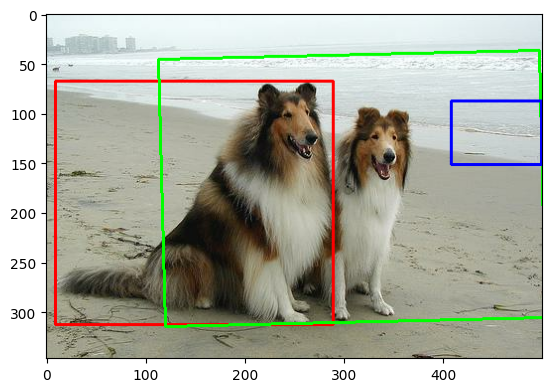

In [17]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

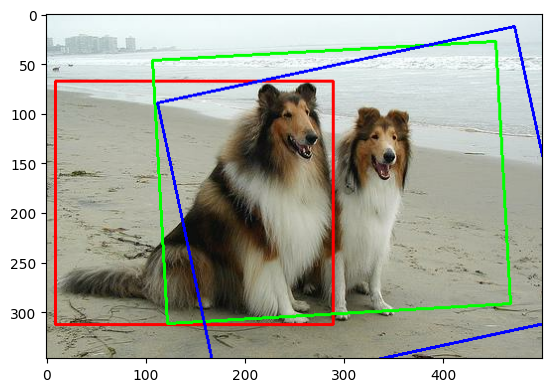

ㅋㅋ더 안좋아진 것도 있습니다.

CAM IOU: 0.74
Grad-CAM IOU: 0.67


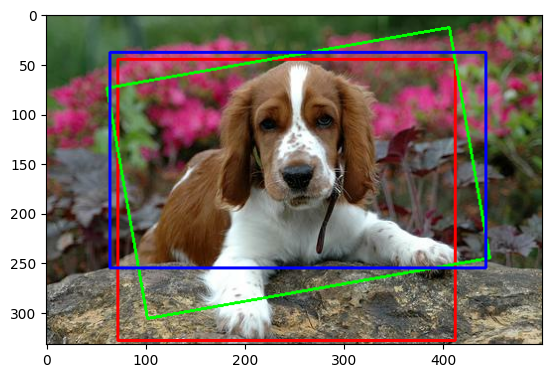

In [22]:
item = get_one(ds_test)
image = copy.deepcopy(item['image'])

# 라벨 bbox 가져오기
label_bbox = minmax_to_rect(item['objects']['bbox'], image)

# CAM, Grad-CAM 이미지 생성
cam_image = generate_cam(cam_model, item)
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)

cam_bbox = get_bbox(cam_image)
grad_bbox = get_bbox(grad_cam_image)
image_with_bbox = cv2.drawContours(image, [np.int0(label_bbox)], 0, (255, 0, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [cam_bbox], 0, (0, 255, 0), 2)
image_with_bbox = cv2.drawContours(image_with_bbox, [grad_bbox], 0, (0, 0, 255), 2)

cam_bbox = rect_to_minmax(cam_bbox, item['image'])
cam_iou = get_iou(cam_bbox, item['objects']['bbox'][0])
grad_bbox = rect_to_minmax(grad_bbox, item['image'])
grad_cam_iou = get_iou(grad_bbox, item['objects']['bbox'][0])

print(f'CAM IOU: {cam_iou:.2f}')
print(f'Grad-CAM IOU: {grad_cam_iou:.2f}')

plt.imshow(image_with_bbox)

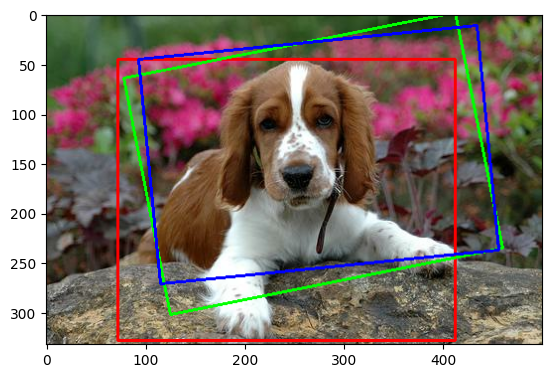

이것도 그냥 이미지마다 차이가 있나봅니다...  
일부만 확인된거라 잘 나온 이미지만 운좋게 확인한 것일 수도 있겠습니다.  
이쯤되면 모델 자체의 문제일지도 모르겠습니다...

### 결론
- CAM과 Grad-CAM은 object의 주요 특정 위치를 반영하여 보여줍니다.
- 평균적으로 CAM의 결과가 Grad-CAM 결과보단 더 좋게 나왔습니다.
- (추정)GAP를 수행하기 전, class의 숫자와 GAP에 들어가는 이미지의 채널 수를 맞춰주면 전반적인 성능이 개선되는 것 같습니다.


### 의문
- 그렇다면 왜 다른 사람들 코드는 GAP 수행 전 class 수를 맞춰주지 않는건지가 의문입니다.
- 같은 CAM을 설명하는데도 어째서 어떤 그림은 수가 달라도 된다. 아니다로 다른지도 궁금하네요.
- 결국 softmax layer란 softmax를 사용하는 Dense레이어를 의미하는 것일까요..? 논문을 포함한 그림들도 GAP결과에 Fully connected된 softmax 그림을 활용한 것으로 보입니다.